<font color='red'><H1><B><font size="14"><center> Eat, Pray and Love Across continent </H1></B></center></font>

<font><H1><B> IBM Capstone project: Week 4&5 Assignment </H1><B></font>

### *Step 0: Installing and Importing the needed libraries*

In [2]:
!pip install geopy
#from geopy.geocoders import Nominatim
print('Libraries INSTALLED.')

Libraries INSTALLED.


In [5]:
#installing and importing needed libraries

import random # library for random number generation
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library to process data as dataframes/for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# import library to handle JSON files
import json 
# tranform JSON file into a pandas dataframe
from pandas.io.json import json_normalize 

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
#!pip install geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.pyplot as plt # plotting library
# backend for rendering plots within the browser
import matplotlib.cm as cm
import matplotlib.colors as colors
%matplotlib inline 

# import k-means from clustering stage
from sklearn.cluster import KMeans
from sklearn.datasets.samples_generator import make_blobs

# install and import map rendering library
!pip install folium
import folium 

from html.parser import HTMLParser
import time

# library to handle requests
!pip install requests
import requests

# import the BeautifulSoup library so we can parse HTML and XML documents
!pip install BeautifulSoup4
from bs4 import BeautifulSoup

# import the library we use to open URLs
import urllib
import urllib.request 

# convert an address into latitude and longitude values
!pip install geocoder
import geocoder # import geocoder

# import required libraries
from IPython.display import display
from IPython.display import HTML
from IPython.display import IFrame
from IPython.display import clear_output

#import Esri
#import arcgis
import widgetsnbextension
import ipywidgets
#from arcgis.gis import GIS

import os    
import sys  
import base64
import pathlib
from os import path

clear_output()
print('Libraries imported.')


Libraries imported.


In [6]:
try:
    import pgeocode
    print ('Postal Geocoder available')
except ImportError:
    # installing geocoder
    print ('Installing Postal Geocoder')
    !pip install geocoder
    clear_output()
    print ('Postal Geocoder Installed')
    
#import geocoder

Postal Geocoder Installed


In [7]:
# Check Esri GIS
try:
    import GIS
    import arcgis
    from arcgis.gis import GIS
    print ('Esri GIS available')
except ImportError:
    # installing Esri GIS
    print ('Installing Esri GIS')
    !conda install -c esri arcgis --yes
    from arcgis.gis import GIS
    clear_output()
    print ('Esri GIS Installed')
    
clear_output()
print ('All Packages Correctly Installed')

All Packages Correctly Installed


### *Section 1: building/defining functions to use*

In [8]:
#Function to get the Coordinates of the selected city
def getMapOfCity(cityname):
    city_cont= geocoder.arcgis(cityname)
    return city_cont
    return city_cont.lng,city_cont.lat

In [9]:
#Function to show Map of the selected city
def drawMapOfCity(city_lat, city_long, zoom_level):
    map_city = folium.Map(location=[city_lat, city_long], zoom_start=zoom_level)
# Save it as html
    return map_city

In [10]:
#Function to read Foursqaure Credentials from a relevent path
def readFourSquareCredentials():
    file_path = path.relpath("HM_Foursquare_Credentials.txt")
    with open(file_path) as f:
        MyClientID=f.readline().strip()
        MyClientSECRET=f.readline().strip()
        MyVersion=f.readline().strip()
        return MyClientID, MyClientSECRET,MyVersion;
    f.close()

In [11]:
#Function to set the limit of the number of venues
def SetLimit(venues_limit):
    LIMIT=venues_limit
    return LIMIT

In [12]:
#Function to set the radius to search for the venues within
def SetRadius(venues_within_radius):
    RADIUS=venues_within_radius
    return RADIUS

In [13]:
#Function to return the url of the city (using Foursquare)
def getCityURL(CLIENT_ID, CLIENT_SECRET, VERSION, city_lat, city_long, radius, LIMIT):
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    city_lat, 
    city_long, 
    radius, 
    LIMIT)
    return url

In [14]:
#Function to get he nearby venues
def getNearbyVenues(names, latitudes, longitudes, radius=5000):
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    #print (nearby_venues.head(30))
    return(nearby_venues)

In [15]:
#Function to read the borough/neighborhood in the city from an excel file
def readBoroughsFromExcel(excel_filepath):
    df = pd.read_excel (excel_filepath) #for an earlier version of Excel, you may need to use the file extension of 'xls'
    return df

In [16]:
def readBoroughsFromCSV(csv_filepath):
    df = pd.read_csv(csv_filepath, encoding = 'unicode_escape') 
    return df

In [17]:
#Function to get the Longitude and Latitude of each borough/neighborhood in the city
def GetLatLongOfBoroughs(city_boroughs_df, restOfAddress):
    # Lists to hold data
    Latitude=[]
    Longitude=[]

# Loop & Get coord for postal codes using ArcGIS Geocoder
    for i in range(0,len(city_boroughs_df)):
        address = city_boroughs_df.iloc[i] + restOfAddress
        g= geocoder.arcgis(address)
        Latitude.append(g.lat)
        Longitude.append(g.lng)

    city_boroughs_df['Latitude']=Latitude
    city_boroughs_df['Longitude']=Longitude
    return city_boroughs_df
# Create new dataframe to hold coord


In [18]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [19]:
#function to return the top venues
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [20]:
#function to drop venues with count less than 10 and clean the dataframe
def dropVenuesCountLessThanTen(venues_df,CSV_filename):
    dfx = venues_df.groupby(['Venue Category']).count()
    print (dfx.shape)
    dfx.drop('Neighborhood Latitude',axis=1, inplace=True)
    dfx.drop('Neighborhood Longitude',axis=1, inplace=True)
    dfx.drop('Venue',axis=1, inplace=True)
    dfx.drop('Venue Latitude',axis=1, inplace=True)
    dfx.drop('Venue Longitude',axis=1, inplace=True)
    dfx.rename(columns={'Neighborhood': 'Count'}, inplace=True)
    dfx.head()
    dfx_return=dfx.copy()
    dfy = dfx.loc[(dfx['Count'] >= 10)]
    dfy = dfy.sort_values(['Count'], ascending=False )
    dfy.to_csv(CSV_filename)
    return dfy

In [21]:
#function to count each of Eat/Pray and Love categories assigned
def CountEachCategoryofEatPrayLove(df_with_EatPrayLoveAssigned):
    Final_Categ = df_with_EatPrayLoveAssigned.groupby(['Category'])['Count'].sum().reset_index()
    print (Final_Categ.shape)
    Final_Categ
    EatPrayLove_CityContinent = Final_Categ.loc[(Final_Categ ['Category'] != 'drop')]
    EatPrayLove_CityContinent 
    return EatPrayLove_CityContinent 

In [22]:
#function to call all other functions for the chosen city per continent
#Main function parameters description:
#-------------------------------------
#City: name of city under analysis i.e. "Mexico City, Mexico".
#Continent_City_Coordinates: dataframe to include the coordinates of the City.
#map_of_city: map object to include the map of the City i.e. to illustrate/display.
#html_map_filename: html file name to save the map to.
#City_Divisions_df: dataframe to include the city's neighborhoods/boroughs (to get the corresponding venues for).
#CSVfile_including_cityDivisions: csv file to read the the city's neighborhoods/boroughs from.
#City_Venues_df: dataframe to include the venues returned for each City's neighborhoods/boroughs
#Divisions_Names:column title from city's neighborhoods/boroughs csv file
#Selected_Venues_filename: filename to save the returned venues (filtered)
 

def mainContinentsCity_EatPrayLove(City,Continent_City_Coordinates,
                                   map_of_city,
                                   html_map_filename, 
                                   City_Divisions_df,
                                   CSVfile_including_cityDivisions,
                                   City_Venues_df,
                                   Divisions_Names,
                                   Selected_Venues_filename,
                                   ):
    
    Continent_City_Coordinates=getMapOfCity(City)
    #print (Continent_City_Coordinates.lat, Continent_City_Coordinates.lng)
    # create map of the selected city using latitude and longitude values
    map_of_city= drawMapOfCity(Continent_City_Coordinates.lat,Continent_City_Coordinates.lng, 13)
    # Save it as html
    map_of_city.save(html_map_filename)
    # Optional:: Display Map
    #display(map_of_city)
    City_Divisions_df=readBoroughsFromCSV(CSVfile_including_cityDivisions)
    #print (City_Divisions_df)
    City_Divisions_df=GetLatLongOfBoroughs(City_Divisions_df,City)
    #print(City_Divisions_df)
    print('There are {} ' .format(City_Divisions_df.shape[0]) + ' Boroughs in ' + City)
    City_Venues_df = getNearbyVenues(names=City_Divisions_df[Divisions_Names],
                                     latitudes=City_Divisions_df['Latitude'],
                                     longitudes=City_Divisions_df['Longitude']
                                    )
    
    City_Venues_forClusters_df= City_Venues_df.copy()
    #print (City_Venues_forClusters_df.head(10))
    #City_Venues_df.head()
    City_Venues_df=dropVenuesCountLessThanTen(City_Venues_df, Selected_Venues_filename)
    #print(City_Venues_df.head(30))
    #City_Venues_df.head(30)
    print('Venues for ' + City + ' is now available for the next step')
    return City_Venues_df,City_Venues_forClusters_df

In [23]:
#function to clean and categorize venues per city per continent
def categorizeSelectedVenuesPerCity_EatPrayLove(City_With_Category_filename,):
    City_Categories_df=pd.read_csv(City_With_Category_filename)
    #print (City_Categories_df)
    EatPrayLove_Continent_City =CountEachCategoryofEatPrayLove(City_Categories_df)
    #EatPrayLove_Continent_City
    return EatPrayLove_Continent_City

In [24]:
#function to analyze and group neighborhoods in the selected city
def AnalyzeNeighborhoods(VenuesClusters_df):
    City_onehot = pd.get_dummies(VenuesClusters_df[['Venue Category']], prefix="", prefix_sep="")

    # add neighborhood column back to dataframe
    City_onehot['Neighborhood'] = VenuesClusters_df['Neighborhood'] 

    # move neighborhood column to the first column
    fixed_columns = [City_onehot.columns[-1]] + list(City_onehot.columns[:-1])
    City_onehot = City_onehot[fixed_columns]
    City_grouped = City_onehot.groupby('Neighborhood').mean().reset_index()
    City_grouped
    
    num_top_venues = 10

    for hood in City_grouped['Neighborhood']:
        print("----"+hood+"----")
        temp = City_grouped[City_grouped['Neighborhood'] == hood].T.reset_index()
        temp.columns = ['venue','freq']
        temp = temp.iloc[1:]
        temp['freq'] = temp['freq'].astype(float)
        temp = temp.round({'freq': 2})
        print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
        print('\n')

    num_top_venues = 10

    indicators = ['st', 'nd', 'rd']

    # create columns according to number of top venues
    columns = ['Neighborhood']
    for ind in np.arange(num_top_venues):
        try:
            columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
        except:
            columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
    neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
    neighborhoods_venues_sorted['Neighborhood'] = City_grouped['Neighborhood']

    for ind in np.arange(City_grouped.shape[0]):
        neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(City_grouped.iloc[ind, :], num_top_venues)

    #print(neighborhoods_venues_sorted.head(10))
    
    return City_grouped,neighborhoods_venues_sorted
    

In [25]:
#function to create clusters per city
def createClusters(VenuesClusters_df,City_grouped,ClusterName,kclusters,neighborhoods_venues_sorted):
    City_grouped_clustering = City_grouped.drop('Neighborhood', 1)

    # run k-means clustering
    kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(City_grouped_clustering)

    # check cluster labels generated for each row in the dataframe
    print(kmeans.labels_[0:10])
    # add clustering labels
    neighborhoods_venues_sorted.insert(0, ClusterName, kmeans.labels_)

    City_merged = VenuesClusters_df
    #print(MexicoCity_merged.head(10))
    # merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
    City_merged = City_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

    print(City_merged.shape)
    #print(MexicoCity_merged.head(30)) # check the last columns!
    return City_merged

In [26]:
def analyzeClusters(City_merged_df,ClusterName,ContName,CName,CTName):
    City_merged_df.loc[City_merged_df[ClusterName] == 0, City_merged_df.columns[[0] + list(range(6, City_merged_df.shape[1]))]]
    Cluster1_df=City_merged_df.loc[City_merged_df[ClusterName] == 0, City_merged_df.columns[[0] + list(range(6, City_merged_df.shape[1]))]]
    
    City_merged_df.loc[City_merged_df[ClusterName] == 1, City_merged_df.columns[[0] + list(range(6, City_merged_df.shape[1]))]]
    Cluster2_df=City_merged_df.loc[City_merged_df[ClusterName] == 1, City_merged_df.columns[[0] + list(range(6, City_merged_df.shape[1]))]]

    City_merged_df.loc[City_merged_df[ClusterName] == 2, City_merged_df.columns[[0] + list(range(6, City_merged_df.shape[1]))]]
    Cluster3_df=City_merged_df.loc[City_merged_df[ClusterName] == 2, City_merged_df.columns[[0] + list(range(6, City_merged_df.shape[1]))]]
    
    City_merged_df.loc[City_merged_df[ClusterName] == 3, City_merged_df.columns[[0] + list(range(6, City_merged_df.shape[1]))]]
    Cluster4_df=City_merged_df.loc[City_merged_df[ClusterName] == 3, City_merged_df.columns[[0] + list(range(6, City_merged_df.shape[1]))]]
    
    City_merged_df.loc[City_merged_df[ClusterName] == 4, City_merged_df.columns[[0] + list(range(6, City_merged_df.shape[1]))]]
    Cluster5_df=City_merged_df.loc[City_merged_df[ClusterName] == 4, City_merged_df.columns[[0] + list(range(6, City_merged_df.shape[1]))]]
    
    
    #FIRST CLUSTER
    C1=1
    X1=len(Cluster1_df['Neighborhood'].unique())
    Y1=len(Cluster1_df['Venue Category'].unique())
    Z1=Cluster1_df['Venue Category'].count()

    
    CContinent.append(ContName)
    CCountry.append(CName)
    CCity.append(CTName)
    CNumber.append(C1)
    CNeighboors.append(X1)
    CVen.append(Y1)
    CTotalVenues.append(Z1)
    #print (CContinent,CCity,CNumber,CNeighboors,CVen,CTotalVenues)

    #SECOND CLUSTER
    C2=2
    X2=len(Cluster2_df['Neighborhood'].unique())
    Y2=len(Cluster2_df['Venue Category'].unique())
    Z2=Cluster2_df['Venue Category'].count()

   
    CContinent.append(ContName)
    CCountry.append(CName)
    CCity.append(CTName)
    CNumber.append(C2)
    CNeighboors.append(X2)
    CVen.append(Y2)
    CTotalVenues.append(Z2)
    #print (CContinent,CCity,CNumber,CNeighboors,CVen,CTotalVenues)
    
    #THIRD CLUSTER
    C3=3
    X3=len(Cluster3_df['Neighborhood'].unique())
    Y3=len(Cluster3_df['Venue Category'].unique())
    Z3=Cluster3_df['Venue Category'].count()

    CContinent.append(ContName)
    CCountry.append(CName)
    CCity.append(CTName)
    CNumber.append(C3)
    CNeighboors.append(X3)
    CVen.append(Y3)
    CTotalVenues.append(Z3)
    #print (CContinent,CCity,CNumber,CNeighboors,CVen,CTotalVenues)
    
    #FOURTH CLUSTER
    C4=4
    X4=len(Cluster4_df['Neighborhood'].unique())
    Y4=len(Cluster4_df['Venue Category'].unique())
    Z4=Cluster4_df['Venue Category'].count()

    CContinent.append(ContName)
    CCountry.append(CName)
    CCity.append(CTName)
    CNumber.append(C4)
    CNeighboors.append(X4)
    CVen.append(Y4)
    CTotalVenues.append(Z4)
    #print (CContinent,CCity,CNumber,CNeighboors,CVen,CTotalVenues)
    
    #FIFTH CLUSTER
    C5=5
    X5=len(Cluster5_df['Neighborhood'].unique())
    Y5=len(Cluster5_df['Venue Category'].unique())
    Z5=Cluster5_df['Venue Category'].count()

    CContinent.append(ContName)
    CCountry.append(CName)
    CCity.append(CTName)
    CNumber.append(C5)
    CNeighboors.append(X5)
    CVen.append(Y5)
    CTotalVenues.append(Z5)
  
    
    return CContinent, CCountry, CCity, CNumber, CNeighboors,CVen,CTotalVenues

### *Section 2: Initialize/Set Credentials and dataframes*

#### *Section 2.1: Set Foursquare Credentials*

In [27]:
CLIENT_ID,CLIENT_SECRET,VERSION = readFourSquareCredentials() # your Foursquare ID
LIMIT = SetLimit(500) # limit of number of venues returned by Foursquare API
radius = SetRadius(5000)

#### *Section 2.2:  Create a dataframe to contain the continent, city, country and Eat, Pray and Love count per city*

In [168]:
Continent_Scores = pd.DataFrame(columns=['Continent Name', 'Country', 'City', 'Eat','Pray','Love'])
#Continent_Scores= Continent_Scores.astype({"Continent Name": str, "Country": str, "City":str, "Eat":int, "Pray":int, "Love":int})
Continent_Scores
#created list to include the results of the data preparation and collection
Continent=[]
Country=[]
City=[]
Eat=[]
Pray=[]
Love=[]


#### *Section 2.3:  Create a dataframe to contain the results of clustering neighborhoods per city (battle of neighborhoods)*

In [71]:
#Initialize clusters to include the results of the Dataframe
FinalClusterColumns=['Continent','Country','City','Cluster Number','Number of Neighborhoods','Number of Venue Categories', 'Number of Venues']
CContinent=[]
CCountry=[]
CCity=[]
CNumber=[]
CNeighboors=[]
CVen=[]
CTotalVenues=[]
Clusters_Across_Continents_df=pd.DataFrame({'Continent':CContinent,
                                            'Country':CCountry,
                                            'City':CCity,
                                            'Cluster Number':CNumber,
                                            'Number of Neighborhoods':CNeighboors,
                                            'Number of Venue Categories':CVen,
                                            'Number of Venues':CTotalVenues})

#### *Section 2.4:  Defining inputs needed for cluster analysis*

In [72]:
#defining inputs needed for cluster analysis
kclusters=5
MClusterName='Mexico_CityClusters'
SClusterName='SaoPaulo_Clusters'
TClusterName='Tokyo_Clusters'
SYClusterName='Sydney_Clusters'
PClusterName='Paris_Clusters'
CAClusterName='GreaterCairo_Clusters'

#defining some inputs to use in the next functions
NA_Cont="North America"
NA_Cnt='Mexico'
NA_Cname='Mexico City'

SA_Cont='South America'
SA_Cnt='Brazil'
SA_Cname='Sao Paulo'

A_Cont='Asia'
A_Cnt='Japan'
A_Cname='Tokyo'

Aust_Cont='Australia'
Aust_Cnt='Australia'
Aust_Cname='Sydney'

Eur_Cont='Europe'
Eur_Cnt='France'
Eur_Cname='Paris'

Afr_Cont='Africa'
Afr_Cnt='Egypt'
Afr_Cname='Greater Cairo'

#LISTS TO ADD THE RESULTS OF CLUSTERING TO
dfc1=[]
dfc2=[]
dfc3=[]
dfc4=[]
dfc5=[]
dfc6=[]
dfc7=[]


### *Section 3: Start Exploring each city and its venues*

#### *Section 3.1: First Continent - North America: Mexico City, Mexico*

In [32]:
#Initializing the dataframes and other parameters to pass to the main function
NorthAmerica_Cont_MexicoCity=pd.DataFrame()
map_NorthAmerica_MexicoCity=drawMapOfCity(0,0,0)
Mexico_City_Boroughs_df=pd.DataFrame()
df_MexicoCity_venues=pd.DataFrame()
Mexico_City_Categories_df=pd.DataFrame()




#Call main function to pass the city under analysis, the city's neighborhoods/boroughs/wards/okrugs/districts/governorates
#Get the venues categorized under 'Venue Category' within the city's neighborhoods and filter the venues (delete venues whose count less than 10)
#Return the venues 
EatPrayLove_NorthAmerica_Mexico_Venues, EatPrayLove_NorthAmerica_Mexico_VenuesClusters= mainContinentsCity_EatPrayLove('Mexico City, Mexico',
                                                                                                                       NorthAmerica_Cont_MexicoCity,
                                                                                                                       map_NorthAmerica_MexicoCity,
                                                                                                                       'NorthAmerica_Cont_MexicoCity.html',
                                                                                                                       Mexico_City_Boroughs_df,
                                                                                                                       'MexicoCityBoroughs.csv',
                                                                                                                       df_MexicoCity_venues,
                                                                                                                       'MexicoCity_Boroughs',
                                                                                                                       'MexicoCitySelectedVenues.csv'
                                                                                                                      )
                                                                                                                                                                  
                                                                                                                      

#print (EatPrayLove_NorthAmerica_Mexico_Venues.head(10)
#print (EatPrayLove_NorthAmerica_Mexico_VenuesClusters.head(10))


There are 16  Boroughs in Mexico City, Mexico
(213, 6)
Venues for Mexico City, Mexico is now available for the next step


#### *Section 3.2: Second Continent - South America: Sao Paulo, Brazil*

In [43]:
#Initializing the dataframes and other parameters to pass to the main function
SouthAmerica_Cont_SaoPaulo=pd.DataFrame()
map_SouthAmerica_SaoPaulo=drawMapOfCity(0,0,0)
SaoPaulo_Boroughs_df=pd.DataFrame()
df_SaoPaulo_venues=pd.DataFrame()
SaoPaulo_Categories_df=pd.DataFrame()

#Call main function to pass the city under analysis, the city's neighborhoods/boroughs/wards/okrugs/districts/governorates
#Get the venues categorized under 'Venue Category' within the city's neighborhoods and filter the venues (delete venues whose count less than 10)
#Return the venues 
EatPrayLove_SouthAmerica_SaoPaulo_Venues, EatPrayLove_SouthAmerica_SaoPaulo_VenuesClusters= mainContinentsCity_EatPrayLove('Sao Paulo, Brazil',
                                                                                                                           SouthAmerica_Cont_SaoPaulo,
                                                                                                                           map_SouthAmerica_SaoPaulo,
                                                                                                                           'SouthAmerica_Cont_SaoPaulo.html',
                                                                                                                           SaoPaulo_Boroughs_df,
                                                                                                                           'SaoPauloBoroughs.csv',
                                                                                                                           df_SaoPaulo_venues,
                                                                                                                           'SaoPaulo_Boroughs',
                                                                                                                           'SaoPauloSelectedVenues.csv'
                                                                                                                          )
                                                                                                                         

                                                                         

#EatPrayLove_SouthAmerica_SaoPaulo_Venues
#EatPrayLove_SouthAmerica_SaoPaulo_VenuesClusters

There are 32  Boroughs in Sao Paulo, Brazil
(242, 6)
Venues for Sao Paulo, Brazil is now available for the next step


#### *Section 3.3: Third Continent - Asia: Tokyo, Japan*

In [44]:
#Initializing the dataframes and other parameters to pass to the main function
Asia_Cont_Tokyo=pd.DataFrame()
map_Asia_Tokyo=drawMapOfCity(0,0,0)
Tokyo_Wards_df=pd.DataFrame()
df_SaoPaulo_venues=pd.DataFrame()
Tokyo_Categories_df=pd.DataFrame()

#Call main function to pass the city under analysis, the city's neighborhoods/boroughs/wards/okrugs/districts/governorates
#Get the venues categorized under 'Venue Category' within the city's neighborhoods and filter the venues (delete venues whose count less than 10)
#Return the venues 
EatPrayLove_Asia_Tokyo_Venues,EatPrayLove_Asia_Tokyo_VenuesClusters= mainContinentsCity_EatPrayLove('Tokyo, Japan',
                                                                                                    Asia_Cont_Tokyo,
                                                                                                    map_Asia_Tokyo,
                                                                                                    'Asia_Cont_Tokyo.html',
                                                                                                    Tokyo_Wards_df,
                                                                                                    'TokyoWards.csv',
                                                                                                    df_SaoPaulo_venues,
                                                                                                    'Tokyo_Wards',
                                                                                                    'TokyoSelectedVenues.csv'
                                                                                                   )
                                                                                                    
                                                                                                   
                                                             
#EatPrayLove_Asia_Tokyo_Venues
#EatPrayLove_Asia_Tokyo_VenuesClusters

There are 23  Boroughs in Tokyo, Japan
(194, 6)
Venues for Tokyo, Japan is now available for the next step


#### *Section 3.4: Fourth Continent - Australia: Sydney, Australia*

In [45]:
#Initializing the dataframes and other parameters to pass to the main function
Australia_Cont_Sydney=pd.DataFrame()
map_Australia_Sydney=drawMapOfCity(0,0,0)
Sydney_Councils_df=pd.DataFrame()
df_Sydney_venues=pd.DataFrame()
Sydney_Categories_df=pd.DataFrame()

#Call main function to pass the city under analysis, the city's neighborhoods/boroughs/wards/okrugs/districts/governorates
#Get the venues categorized under 'Venue Category' within the city's neighborhoods and filter the venues (delete venues whose count less than 10)
#Return the venues
EatPrayLove_Australia_Sydney_Venues,EatPrayLove_Australia_Sydney_VenuesClusters= mainContinentsCity_EatPrayLove('Sydney, Australia',
                                                                                                                Australia_Cont_Sydney,
                                                                                                                map_Australia_Sydney,
                                                                                                                'Australia_Cont_Sydney.html',
                                                                                                                Sydney_Councils_df,
                                                                                                                'SydneyCouncils.csv',
                                                                                                                df_Sydney_venues,
                                                                                                                'Sydney_Councils',
                                                                                                                'SydneySelectedVenues.csv'
                                                                                                               )
                                                                   
#EatPrayLove_Australia_Sydney_VenuesClusters

There are 31  Boroughs in Sydney, Australia
(216, 6)
Venues for Sydney, Australia is now available for the next step


#### *Section 3.5: Fifth Continent - Europe: Paris, France*

In [46]:
#Initializing the dataframes and other parameters to pass to the main function
Europe_Cont_Paris=pd.DataFrame()
map_Europe_Paris=drawMapOfCity(0,0,0)
Paris_Arrondissements_df=pd.DataFrame()
df_Paris_venues=pd.DataFrame()
Moscow_Categories_df=pd.DataFrame()

#Call main function to pass the city under analysis, the city's neighborhoods/boroughs/wards/okrugs/districts/governorates
#Get the venues categorized under 'Venue Category' within the city's neighborhoods and filter the venues (delete venues whose count less than 10)
#Return the venues
EatPrayLove_Europe_Paris_venues,EatPrayLove_Europe_Paris_VenuesClusters= mainContinentsCity_EatPrayLove('Paris, France',
                                                                                                        Europe_Cont_Paris,
                                                                                                        map_Europe_Paris,
                                                                                                        'Europe_Cont_Paris.html',
                                                                                                        Paris_Arrondissements_df,
                                                                                                        'ParisArrondissements.csv',
                                                                                                        df_Paris_venues,
                                                                                                        'Paris_Arrondissements',
                                                                                                        'ParisSelectedVenues.csv'
                                                                                                       )
                                                                
#EatPrayLove_Europe_Paris_VenuesClusters

There are 20  Boroughs in Paris, France
(131, 6)
Venues for Paris, France is now available for the next step


#### *Section 3.6: Sixth Continent - Africa: Greater Cairo, Egypt*

In [47]:
#Initializing the dataframes and other parameters to pass to the main function
Africa_Cont_GreaterCairo=pd.DataFrame()
map_Africa_GreaterCairo=drawMapOfCity(0,0,0)
GreaterCairo_Governorates_df=pd.DataFrame()
df_GreaterCairo_venues=pd.DataFrame()
GreaterCairo_Categories_df=pd.DataFrame()


#Call main function to pass the city under analysis, the city's neighborhoods/boroughs/wards/okrugs/districts/governorates
#Get the venues categorized under 'Venue Category' within the city's neighborhoods and filter the venues (delete venues whose count less than 10)
#Return the venues
EatPrayLove_Africa_GreaterCairo_Venues,EatPrayLove_Africa_GreaterCairo_VenuesClusters= mainContinentsCity_EatPrayLove('Greater Cairo, Egypt',
                                                                                                                      Africa_Cont_GreaterCairo,
                                                                                                                      map_Africa_GreaterCairo,
                                                                                                                      'Africa_Cont_GreaterCairo.html',
                                                                                                                      GreaterCairo_Governorates_df,
                                                                                                                      'GreaterCairoGovernorates.csv',
                                                                                                                      df_GreaterCairo_venues,
                                                                                                                      'GreaterCairo_Governorates',
                                                                                                                      'GreaterCairoSelectedVenues.csv'
                                                                                                                     )
                                                                      

#EatPrayLove_Africa_GreaterCairo_Venues
#EatPrayLove_Africa_GreaterCairo_VenuesClusters

There are 17  Boroughs in Greater Cairo, Egypt
(120, 6)
Venues for Greater Cairo, Egypt is now available for the next step


<font color='blue'><H1><B> Now, we have our datasets ready, we will experience two Exercises: 1- Battle of Neighborhood, 2- Eat,Pray,Love Category</H1><B></font>

### *Section 4 - Part 1: Battle of Neighborhood - Cluster Neighborhoods in each city*

In [48]:
MexicoCity_grouped,neighborhoods_venues_sorted=AnalyzeNeighborhoods(EatPrayLove_NorthAmerica_Mexico_VenuesClusters)
MexicoCity_grouped

----Azcapotzalco----
                  venue  freq
0    Mexican Restaurant  0.22
1            Taco Place  0.11
2        Ice Cream Shop  0.09
3                Bakery  0.05
4            Food Truck  0.04
5          Burger Joint  0.03
6        Breakfast Spot  0.03
7          Cupcake Shop  0.02
8           Coffee Shop  0.02
9  Gym / Fitness Center  0.02


----Benito Juárez----
                   venue  freq
0         Ice Cream Shop  0.10
1            Coffee Shop  0.07
2                 Bakery  0.06
3     Mexican Restaurant  0.05
4             Food Truck  0.04
5             Taco Place  0.04
6  Performing Arts Venue  0.03
7          Deli / Bodega  0.02
8    Japanese Restaurant  0.02
9           Burger Joint  0.02


----Coyoacán----
                    venue  freq
0             Coffee Shop  0.07
1          Ice Cream Shop  0.05
2            Concert Hall  0.03
3       French Restaurant  0.03
4              Taco Place  0.03
5      Mexican Restaurant  0.03
6  Argentinian Restaurant  0.03
7   Perfo

,Neighborhood,Yoga Studio,Accessories Store,Airport Lounge,Airport Service,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,BBQ Joint,Bakery,Bar,Baseball Field,Baseball Stadium,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bistro,Bookstore,Botanical Garden,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Butcher,Cafeteria,Café,Candy Store,Car Wash,Cemetery,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Gym,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Dentist's Office,Department Store,Dessert Shop,Diner,Discount Store,Dog Run,Donut Shop,Drugstore,Eastern European Restaurant,Electronics Store,Event Space,Exhibit,Factory,Fair,Falafel Restaurant,Farm,Fast Food Restaurant,Festival,Field,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gastropub,General Entertainment,Gift Shop,Golf Course,Gourmet Shop,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hockey Arena,Hookah Bar,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Korean Restaurant,Leather Goods Store,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Monument / Landmark,Motel,Mountain,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Nature Preserve,Non-Profit,Opera House,Optical Shop,Organic Grocery,Other Event,Other Great Outdoors,Park,Performing Arts Venue,Perfume Shop,Pet Store,Pharmacy,Piercing Parlor,Pizza Place,Playground,Plaza,Pool,Post Office,Public Art,Racetrack,Residential Building (Apartment / Condo),Restaurant,Rock Climbing Spot,Salad Place,Salon / Barbershop,Salsa Club,Sandwich Place,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shopping Mall,Skate Park,Snack Place,Soccer Field,Soccer Stadium,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Spiritual Center,Sporting Goods Shop,Sports Club,Stadium,Stationery Store,Steakhouse,Street Art,Supermarket,Sushi Restaurant,Taco Place,Tapas Restaurant,Tattoo Parlor,Tea Room,Thai Restaurant,Theater,Theme Park,Theme Park Ride / Attraction,Thrift / Vintage Store,Toy / Game Store,Track,Trail,University,Vegetarian / Vegan Restaurant,Veterinarian,Vineyard,Warehouse Store,Water Park,Wine Shop,Wings Joint
0,Azcapotzalco,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.000000,0.00,0.05,0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.00,0.00,0.00,0.030000,0.01,0.00,0.00,0.030000,0.00,0.00,0.000000,0.010000,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.01,0.00,0.00,0.020000,0.00,0.00,0.01,0.00,0.01,0.00,0.02,0.00,0.01,0.00,0.00,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.04,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.010000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.020000,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.09,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.220000,0.00,0.00,0.01,0.00,0.00,0.01,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.010000,0.00,0.00,0.00,0.02,0.00,0.020000,0.00,0.000000,0.000000,0.00,0.00,0.00,0.00,0.020000,0.00,0.01,0.00,0.00,0.01,0.000000,0.00,0.00,0.02,0.01,0.01,0.01,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.11000,0.00,0.00,0.00,

In [49]:
MexicoCity_merged=createClusters(EatPrayLove_NorthAmerica_Mexico_VenuesClusters,MexicoCity_grouped,MClusterName,kclusters,neighborhoods_venues_sorted)
MexicoCity_merged

[1 4 4 2 0 1 1 1 2 4]
(1547, 18)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Mexico_CityClusters,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Álvaro Obregón,19.38945,-99.19451,Óptica Costco,19.386842,-99.190838,Optical Shop,4,Ice Cream Shop,Mexican Restaurant,Yoga Studio,Coffee Shop,Café,Pet Store,Park,Japanese Restaurant,Seafood Restaurant,Health & Beauty Service
1,Álvaro Obregón,19.38945,-99.19451,Petco San Antonio,19.384695,-99.188858,Pet Store,4,Ice Cream Shop,Mexican Restaurant,Yoga Studio,Coffee Shop,Café,Pet Store,Park,Japanese Restaurant,Seafood Restaurant,Health & Beauty Service
2,Álvaro Obregón,19.38945,-99.19451,Parrilla Don Beto,19.392015,-99.183585,BBQ Joint,4,Ice Cream Shop,Mexican Restaurant,Yoga Studio,Coffee Shop,Café,Pet Store,Park,Japanese Restaurant,Seafood Restaurant,Health & Beauty Service
3,Álvaro Obregón,19.38945,-99.19451,Paleteria y Neveria Lupita,19.401818,-99.199235,Ice Cream Shop,4,Ice Cream Shop,Mexican Restaurant,Yoga Studio,Coffee Shop,Café,Pet Store,Park,Japanese Restaurant,Seafood Restaurant,Health & Beauty Service
4,Álvaro Obregón,19.38945,-99.19451,Bloc E,19.379126,-99.185810,Rock Climbing Spot,4,Ice Cream Shop,Mexican Restaurant,Yoga Studio,Coffee Shop,Café,Pet Store,Park,Japanese Restaurant,Seafood Restaurant,Health & Beauty Service
5,Álvaro Obregón,19.38945,-99.19451,Neverolandia,19.375743,-99.196785,Ice Cream Shop,4,Ice Cream Shop,Mexican Restaurant,Yoga Studio,Coffee Shop,Café,Pet Store,Park,Japanese Restaurant,Seafood Restaurant,Health & Beauty Service
6,Álvaro Obregón,19.38945,-99.19451,Kimasu,19.394238,-99.179286,Japanese Restaurant,4,Ice Cream Shop,Mexican Restaurant,Yoga Studio,Coffee Shop,Café,Pet Store,Park,Japanese Restaurant,Seafood Restaurant,Health & Beauty Service
7,Álvaro Obregón,19.38945,-99.19451,"Tacos ""El Güero""",19.375949,-99.197802,Mexican Restaurant,4,Ice Cream Shop,Mexican Restaurant,Yoga Studio,Coffee Shop,Café,Pet Store,Park,Japanese Restaurant,Seafood Restaurant,Health & Beauty Service
8,Álvaro Obregón,19.38945,-99.19451,V Motel Boutique,19.399669,-99.181921,Motel,4,Ice Cream Shop,Mexican Restaurant,Yoga Studio,Coffee Shop,Café,Pet Store,Park,Japanese Restaurant,Seafood Restaurant,Health & Beauty Service
9,Álvaro Obregón,19.38945,-99.19451,Mazurka,19.392319,-99.177503,Eastern European Restaurant,4,Ice Cream Shop,Mexican Restaurant,Yoga Studio,Coffee Shop,Café,Pet Store,Park,Japanese Restaurant,Seafood Restaurant,Health & Beauty Service


In [73]:
dfc1,dfc2,dfc3,dfc4,dfc5,dfc6,dfc7=analyzeClusters(MexicoCity_merged,MClusterName,NA_Cont,NA_Cnt,NA_Cname)
#print(dfc1,dfc2,dfc3,dfc4,dfc5,dfc6)
print("FINISHED MEXICO CLUSTERS' ANALYSIS")

FINISHED MEXICO CLUSTERS' ANALYSIS


In [74]:
SaoPauloCity_grouped,neighborhoods_venues_sorted=AnalyzeNeighborhoods(EatPrayLove_SouthAmerica_SaoPaulo_VenuesClusters)
SaoPauloCity_grouped
SaoPaulo_merged=createClusters(EatPrayLove_SouthAmerica_SaoPaulo_VenuesClusters,SaoPauloCity_grouped,SClusterName,kclusters,neighborhoods_venues_sorted)
SaoPaulo_merged

----Aricanduva----
                  venue  freq
0           Pizza Place  0.08
1          Dessert Shop  0.07
2                   Gym  0.05
3   Japanese Restaurant  0.04
4  Brazilian Restaurant  0.04
5        Ice Cream Shop  0.04
6             Pet Store  0.03
7    Italian Restaurant  0.03
8                Bakery  0.03
9          Burger Joint  0.03


----Butantã----
                       venue  freq
0         Italian Restaurant  0.07
1             Ice Cream Shop  0.06
2       Brazilian Restaurant  0.04
3        Japanese Restaurant  0.04
4                Pizza Place  0.04
5                  Bookstore  0.03
6                      Plaza  0.03
7       Gym / Fitness Center  0.02
8  Middle Eastern Restaurant  0.02
9               Cocktail Bar  0.02


----Campo Limpo----
                  venue  freq
0                Bakery  0.12
1           Pizza Place  0.05
2          Burger Joint  0.05
3                   Gym  0.04
4  Brazilian Restaurant  0.04
5  Gym / Fitness Center  0.04
6             Pe

                  venue  freq
0                Bakery  0.13
1  Gym / Fitness Center  0.08
2           Pizza Place  0.07
3  Brazilian Restaurant  0.05
4                   Gym  0.04
5             BBQ Joint  0.03
6            Pastelaria  0.03
7            Food Truck  0.03
8           Snack Place  0.03
9             Pet Store  0.03


----São Miguel Paulista----
                  venue  freq
0           Pizza Place  0.10
1                Bakery  0.10
2   Japanese Restaurant  0.08
3            Restaurant  0.06
4                   Gym  0.05
5  Gym / Fitness Center  0.05
6  Brazilian Restaurant  0.04
7                   Bar  0.03
8        Sandwich Place  0.03
9             BBQ Joint  0.03


----Sé----
                               venue  freq
0         Construction & Landscaping  0.33
1            Comfort Food Restaurant  0.33
2                             Buffet  0.33
3                                Zoo  0.00
4                 Persian Restaurant  0.00
5  Northeastern Brazilian Restaurant  0

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,SaoPaulo_Clusters,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Aricanduva,-23.567700,-46.510250,Sodiê Doces,-23.569948,-46.508913,Dessert Shop,3,Pizza Place,Dessert Shop,Gym,Japanese Restaurant,Ice Cream Shop,Brazilian Restaurant,Italian Restaurant,Bakery,Pet Store,Burger Joint
1,Aricanduva,-23.567700,-46.510250,Outback Steakhouse,-23.565113,-46.501645,Steakhouse,3,Pizza Place,Dessert Shop,Gym,Japanese Restaurant,Ice Cream Shop,Brazilian Restaurant,Italian Restaurant,Bakery,Pet Store,Burger Joint
2,Aricanduva,-23.567700,-46.510250,O Pasteleiro,-23.568446,-46.509513,Food & Drink Shop,3,Pizza Place,Dessert Shop,Gym,Japanese Restaurant,Ice Cream Shop,Brazilian Restaurant,Italian Restaurant,Bakery,Pet Store,Burger Joint
3,Aricanduva,-23.567700,-46.510250,Yogoberry Original,-23.566435,-46.502766,Frozen Yogurt Shop,3,Pizza Place,Dessert Shop,Gym,Japanese Restaurant,Ice Cream Shop,Brazilian Restaurant,Italian Restaurant,Bakery,Pet Store,Burger Joint
4,Aricanduva,-23.567700,-46.510250,Burlina Pet Shop,-23.567432,-46.506863,Pet Store,3,Pizza Place,Dessert Shop,Gym,Japanese Restaurant,Ice Cream Shop,Brazilian Restaurant,Italian Restaurant,Bakery,Pet Store,Burger Joint
5,Aricanduva,-23.567700,-46.510250,Smart Fit,-23.564365,-46.503059,Gym / Fitness Center,3,Pizza Place,Dessert Shop,Gym,Japanese Restaurant,Ice Cream Shop,Brazilian Restaurant,Italian Restaurant,Bakery,Pet Store,Burger Joint
6,Aricanduva,-23.567700,-46.510250,Petz,-23.571821,-46.505755,Pet Store,3,Pizza Place,Dessert Shop,Gym,Japanese Restaurant,Ice Cream Shop,Brazilian Restaurant,Italian Restaurant,Bakery,Pet Store,Burger Joint
7,Aricanduva,-23.567700,-46.510250,Taco Bell,-23.566106,-46.502669,Taco Place,3,Pizza Place,Dessert Shop,Gym,Japanese Restaurant,Ice Cream Shop,Brazilian Restaurant,Italian Restaurant,Bakery,Pet Store,Burger Joint
8,Aricanduva,-23.567700,-46.510250,Daiso Japan,-23.564907,-46.503147,Miscellaneous Shop,3,Pizza Place,Dessert Shop,Gym,Japanese Restaurant,Ice Cream Shop,Brazilian Restaurant,Italian Restaurant,Bakery,Pet Store,Burger Joint
9,Aricanduva,-23.567700,-46.510250,"quem disse, berenice?",-23.565915,-46.503726,Cosmetics Shop,3,Pizza Place,Dessert Shop,Gym,Japanese Restaurant,Ice Cream Shop,Brazilian Restaurant,Italian Restaurant,Bakery,Pet Store,Burger Joint


In [75]:
dfc1,dfc2,dfc3,dfc4,dfc5,dfc6,dfc7=analyzeClusters(SaoPaulo_merged,SClusterName,SA_Cont,SA_Cnt,SA_Cname)
print("FINISHED SAO PAULO CLUSTERS' ANALYSIS")

FINISHED SAO PAULO CLUSTERS' ANALYSIS


In [76]:
Tokyo_grouped,neighborhoods_venues_sorted=AnalyzeNeighborhoods(EatPrayLove_Asia_Tokyo_VenuesClusters)
Tokyo_grouped
Tokyo_merged=createClusters(EatPrayLove_Asia_Tokyo_VenuesClusters,Tokyo_grouped,TClusterName,kclusters,neighborhoods_venues_sorted)
Tokyo_merged

----?ta City ----
                   venue  freq
0    Japanese Restaurant  0.07
1            Coffee Shop  0.07
2               Sake Bar  0.05
3      French Restaurant  0.03
4  Vietnamese Restaurant  0.03
5                 Garden  0.03
6                    Bar  0.03
7        Thai Restaurant  0.03
8               Beer Bar  0.02
9              Bike Shop  0.02


----Adachi City----
                    venue  freq
0        Ramen Restaurant  0.15
1                    Café  0.06
2            Dessert Shop  0.05
3                Sake Bar  0.05
4             Supermarket  0.03
5     Japanese Restaurant  0.03
6               BBQ Joint  0.03
7  Furniture / Home Store  0.03
8      Chinese Restaurant  0.03
9                    Park  0.02


----Arakawa City----
                 venue  freq
0             Sake Bar  0.08
1            BBQ Joint  0.07
2        Wagashi Place  0.04
3           Bath House  0.04
4  Japanese Restaurant  0.04
5      Soba Restaurant  0.04
6                 Café  0.04
7       Hist

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Tokyo_Clusters,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Adachi City,35.774811,139.804537,Daiso (ダイソー),35.779725,139.811076,Discount Store,3,Ramen Restaurant,Café,Dessert Shop,Sake Bar,Japanese Restaurant,Chinese Restaurant,Supermarket,BBQ Joint,Furniture / Home Store,Hot Spring
1,Adachi City,35.774811,139.804537,ふうりゅう,35.772296,139.797481,Noodle House,3,Ramen Restaurant,Café,Dessert Shop,Sake Bar,Japanese Restaurant,Chinese Restaurant,Supermarket,BBQ Joint,Furniture / Home Store,Hot Spring
2,Adachi City,35.774811,139.804537,Tanaka Shoten (田中商店),35.784591,139.810894,Ramen Restaurant,3,Ramen Restaurant,Café,Dessert Shop,Sake Bar,Japanese Restaurant,Chinese Restaurant,Supermarket,BBQ Joint,Furniture / Home Store,Hot Spring
3,Adachi City,35.774811,139.804537,どんどん 梅島店,35.778472,139.799713,BBQ Joint,3,Ramen Restaurant,Café,Dessert Shop,Sake Bar,Japanese Restaurant,Chinese Restaurant,Supermarket,BBQ Joint,Furniture / Home Store,Hot Spring
4,Adachi City,35.774811,139.804537,椛屋,35.765541,139.798157,Dessert Shop,3,Ramen Restaurant,Café,Dessert Shop,Sake Bar,Japanese Restaurant,Chinese Restaurant,Supermarket,BBQ Joint,Furniture / Home Store,Hot Spring
5,Adachi City,35.774811,139.804537,オーケーストア 一ツ家店,35.780557,139.810863,Supermarket,3,Ramen Restaurant,Café,Dessert Shop,Sake Bar,Japanese Restaurant,Chinese Restaurant,Supermarket,BBQ Joint,Furniture / Home Store,Hot Spring
6,Adachi City,35.774811,139.804537,THE SPA 西新井,35.774935,139.790156,Spa,3,Ramen Restaurant,Café,Dessert Shop,Sake Bar,Japanese Restaurant,Chinese Restaurant,Supermarket,BBQ Joint,Furniture / Home Store,Hot Spring
7,Adachi City,35.774811,139.804537,MEGA Don Quijote (MEGAドン・キホーテ 環七梅島店),35.768850,139.803472,Discount Store,3,Ramen Restaurant,Café,Dessert Shop,Sake Bar,Japanese Restaurant,Chinese Restaurant,Supermarket,BBQ Joint,Furniture / Home Store,Hot Spring
8,Adachi City,35.774811,139.804537,カウボーイ家族 本木店,35.771522,139.784844,Steakhouse,3,Ramen Restaurant,Café,Dessert Shop,Sake Bar,Japanese Restaurant,Chinese Restaurant,Supermarket,BBQ Joint,Furniture / Home Store,Hot Spring
9,Adachi City,35.774811,139.804537,Domremy Outlet (ドンレミーアウトレット),35.751195,139.803079,Dessert Shop,3,Ramen Restaurant,Café,Dessert Shop,Sake Bar,Japanese Restaurant,Chinese Restaurant,Supermarket,BBQ Joint,Furniture / Home Store,Hot Spring


In [77]:
dfc1,dfc2,dfc3,dfc4,dfc5,dfc6,dfc7=analyzeClusters(Tokyo_merged,TClusterName,A_Cont,A_Cnt,A_Cname)
print("FINISHED TOKYO CLUSTERS' ANALYSIS")

FINISHED TOKYO CLUSTERS' ANALYSIS


In [78]:
Sydney_grouped,neighborhoods_venues_sorted=AnalyzeNeighborhoods(EatPrayLove_Australia_Sydney_VenuesClusters)
Sydney_grouped
Sydney_merged=createClusters(EatPrayLove_Australia_Sydney_VenuesClusters,Sydney_grouped,SYClusterName,kclusters,neighborhoods_venues_sorted)
Sydney_merged

----Bayside ----
               venue  freq
0               Café  0.19
1      Grocery Store  0.10
2               Park  0.05
3      Shopping Mall  0.04
4      Train Station  0.04
5     Sandwich Place  0.04
6  Convenience Store  0.04
7        Supermarket  0.04
8             Bakery  0.03
9                Pub  0.03


----Blacktown----
                  venue  freq
0  Fast Food Restaurant  0.07
1                   Gym  0.07
2                  Park  0.07
3       Thai Restaurant  0.05
4         Grocery Store  0.05
5         Movie Theater  0.05
6                  Café  0.05
7                   Pub  0.05
8   Fried Chicken Joint  0.05
9    Burmese Restaurant  0.02


----Burwood----
                 venue  freq
0                 Café  0.22
1    Korean Restaurant  0.09
2                 Park  0.05
3          Coffee Shop  0.04
4               Bakery  0.03
5  Japanese Restaurant  0.03
6   Chinese Restaurant  0.03
7      Thai Restaurant  0.03
8    Indian Restaurant  0.03
9  Shanghai Restaurant  0.02

                venue  freq
0                Café  0.13
1               Hotel  0.06
2                Park  0.05
3             Theater  0.05
4     Thai Restaurant  0.04
5        Cocktail Bar  0.04
6         Coffee Shop  0.04
7           Speakeasy  0.03
8  Chinese Restaurant  0.03
9              Bakery  0.03


----The Hills----
                  venue  freq
0  Fast Food Restaurant  0.11
1     Convenience Store  0.08
2        Sandwich Place  0.07
3           Supermarket  0.06
4                  Café  0.05
5         Shopping Mall  0.05
6         Grocery Store  0.04
7           Pizza Place  0.04
8       Thai Restaurant  0.04
9                   Gym  0.03


----Waverley----
                           venue  freq
0                           Café  0.17
1                          Beach  0.10
2                           Park  0.09
3             Italian Restaurant  0.05
4          Australian Restaurant  0.05
5                       Wine Bar  0.04
6                         Bakery  0.04
7          

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Sydney_Clusters,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bayside,-33.984617,151.051190,Lugarno Gourmet Deli Cafe,-33.975714,151.047702,Deli / Bodega,0,Café,Grocery Store,Park,Supermarket,Train Station,Shopping Mall,Sandwich Place,Convenience Store,Pizza Place,Pub
1,Bayside,-33.984617,151.051190,Oatley Park,-33.981036,151.060810,Park,0,Café,Grocery Store,Park,Supermarket,Train Station,Shopping Mall,Sandwich Place,Convenience Store,Pizza Place,Pub
2,Bayside,-33.984617,151.051190,Edmonds & Greer,-33.980160,151.073924,Café,0,Café,Grocery Store,Park,Supermarket,Train Station,Shopping Mall,Sandwich Place,Convenience Store,Pizza Place,Pub
3,Bayside,-33.984617,151.051190,@the corner,-33.963841,151.056819,Café,0,Café,Grocery Store,Park,Supermarket,Train Station,Shopping Mall,Sandwich Place,Convenience Store,Pizza Place,Pub
4,Bayside,-33.984617,151.051190,Como Pleasure Grounds,-33.997672,151.070224,Park,0,Café,Grocery Store,Park,Supermarket,Train Station,Shopping Mall,Sandwich Place,Convenience Store,Pizza Place,Pub
5,Bayside,-33.984617,151.051190,Lugarno Seafood Restaurant,-33.990960,151.042120,Seafood Restaurant,0,Café,Grocery Store,Park,Supermarket,Train Station,Shopping Mall,Sandwich Place,Convenience Store,Pizza Place,Pub
6,Bayside,-33.984617,151.051190,New York Patisserie,-33.969531,151.079307,Cupcake Shop,0,Café,Grocery Store,Park,Supermarket,Train Station,Shopping Mall,Sandwich Place,Convenience Store,Pizza Place,Pub
7,Bayside,-33.984617,151.051190,The Gamesmen,-33.962371,151.079583,Video Game Store,0,Café,Grocery Store,Park,Supermarket,Train Station,Shopping Mall,Sandwich Place,Convenience Store,Pizza Place,Pub
8,Bayside,-33.984617,151.051190,Bakers Delight,-33.981219,151.081235,Bakery,0,Café,Grocery Store,Park,Supermarket,Train Station,Shopping Mall,Sandwich Place,Convenience Store,Pizza Place,Pub
9,Bayside,-33.984617,151.051190,Oatley Village Pies,-33.981870,151.080620,Australian Restaurant,0,Café,Grocery Store,Park,Supermarket,Train Station,Shopping Mall,Sandwich Place,Convenience Store,Pizza Place,Pub


In [79]:
dfc1,dfc2,dfc3,dfc4,dfc5,dfc6,dfc7=analyzeClusters(Sydney_merged,SYClusterName,Aust_Cont,Aust_Cnt,Aust_Cname)
print("FINISHED SYDNEY CLUSTERS' ANALYSIS")

FINISHED SYDNEY CLUSTERS' ANALYSIS


In [80]:
Paris_grouped,neighborhoods_venues_sorted=AnalyzeNeighborhoods(EatPrayLove_Europe_Paris_VenuesClusters)
Paris_grouped
Paris_merged=createClusters(EatPrayLove_Europe_Paris_VenuesClusters,Paris_grouped,PClusterName,kclusters,neighborhoods_venues_sorted)
Paris_merged

----Batignolles-Monceau----
                venue  freq
0               Hotel  0.18
1   French Restaurant  0.11
2               Plaza  0.06
3              Bakery  0.04
4            Boutique  0.04
5  Italian Restaurant  0.04
6             Theater  0.03
7              Garden  0.03
8       Historic Site  0.03
9            Wine Bar  0.03


----Bourse----
                venue  freq
0               Hotel  0.08
1               Plaza  0.07
2   French Restaurant  0.06
3          Art Museum  0.05
4  Italian Restaurant  0.04
5           Bookstore  0.03
6             Theater  0.03
7  Seafood Restaurant  0.03
8          Restaurant  0.03
9        Cocktail Bar  0.03


----Butte-Montmartre----
                venue  freq
0               Hotel  0.11
1  Italian Restaurant  0.06
2   French Restaurant  0.05
3          Art Museum  0.04
4              Bakery  0.04
5               Plaza  0.04
6       Historic Site  0.03
7            Wine Bar  0.03
8        Concert Hall  0.03
9              Garden  0.03


--

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Paris_Clusters,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Louvre,49.047060,2.51084,Ladurée,49.014258,2.542090,Pastry Shop,3,Hotel,Coffee Shop,Airport Lounge,Fast Food Restaurant,Rest Area,Train Station,Sandwich Place,Bakery,Duty-free Shop,Rental Car Location
1,Louvre,49.047060,2.51084,Paul,49.014310,2.541960,Bakery,3,Hotel,Coffee Shop,Airport Lounge,Fast Food Restaurant,Rest Area,Train Station,Sandwich Place,Bakery,Duty-free Shop,Rental Car Location
2,Louvre,49.047060,2.51084,Anamour,49.018725,2.469032,Turkish Restaurant,3,Hotel,Coffee Shop,Airport Lounge,Fast Food Restaurant,Rest Area,Train Station,Sandwich Place,Bakery,Duty-free Shop,Rental Car Location
3,Louvre,49.047060,2.51084,Moon Sushi,49.004132,2.515859,Japanese Restaurant,3,Hotel,Coffee Shop,Airport Lounge,Fast Food Restaurant,Rest Area,Train Station,Sandwich Place,Bakery,Duty-free Shop,Rental Car Location
4,Louvre,49.047060,2.51084,The Place,49.004498,2.518245,French Restaurant,3,Hotel,Coffee Shop,Airport Lounge,Fast Food Restaurant,Rest Area,Train Station,Sandwich Place,Bakery,Duty-free Shop,Rental Car Location
5,Louvre,49.047060,2.51084,Madame Est Servie,49.003918,2.520880,French Restaurant,3,Hotel,Coffee Shop,Airport Lounge,Fast Food Restaurant,Rest Area,Train Station,Sandwich Place,Bakery,Duty-free Shop,Rental Car Location
6,Louvre,49.047060,2.51084,RER Louvres [D],49.049662,2.501713,Train Station,3,Hotel,Coffee Shop,Airport Lounge,Fast Food Restaurant,Rest Area,Train Station,Sandwich Place,Bakery,Duty-free Shop,Rental Car Location
7,Louvre,49.047060,2.51084,Qatar Airways Business Lounge,49.013613,2.541747,Airport Lounge,3,Hotel,Coffee Shop,Airport Lounge,Fast Food Restaurant,Rest Area,Train Station,Sandwich Place,Bakery,Duty-free Shop,Rental Car Location
8,Louvre,49.047060,2.51084,McDonald's,49.020595,2.465946,Fast Food Restaurant,3,Hotel,Coffee Shop,Airport Lounge,Fast Food Restaurant,Rest Area,Train Station,Sandwich Place,Bakery,Duty-free Shop,Rental Car Location
9,Louvre,49.047060,2.51084,Hôtel Best Western Paris CDG Airport,49.005747,2.521641,Hotel,3,Hotel,Coffee Shop,Airport Lounge,Fast Food Restaurant,Rest Area,Train Station,Sandwich Place,Bakery,Duty-free Shop,Rental Car Location


In [81]:
dfc1,dfc2,dfc3,dfc4,dfc5,dfc6,dfc7=analyzeClusters(Paris_merged,PClusterName,Eur_Cont,Eur_Cnt,Eur_Cname)
#print(dfc1,dfc2,dfc3,dfc4,dfc5,dfc6)
print("FINISHED PARIS CLUSTERS' ANALYSIS")

FINISHED PARIS CLUSTERS' ANALYSIS


In [82]:
GreaterCairo_grouped,neighborhoods_venues_sorted=AnalyzeNeighborhoods(EatPrayLove_Africa_GreaterCairo_VenuesClusters)
GreaterCairo_grouped
GreaterCairo_merged=createClusters(EatPrayLove_Africa_GreaterCairo_VenuesClusters,GreaterCairo_grouped,CAClusterName,kclusters,neighborhoods_venues_sorted)
GreaterCairo_merged

----Abbassia----
                       venue  freq
0                       Café  0.08
1              Historic Site  0.06
2        Egyptian Restaurant  0.05
3                Pastry Shop  0.04
4                Coffee Shop  0.04
5          Convenience Store  0.04
6               Dessert Shop  0.04
7  Middle Eastern Restaurant  0.03
8             Sandwich Place  0.03
9                     Mosque  0.03


----Agouza----
                       venue  freq
0              Historic Site  0.09
1                      Hotel  0.09
2                     Lounge  0.06
3  Middle Eastern Restaurant  0.05
4        Egyptian Restaurant  0.05
5                       Café  0.04
6                  Hotel Bar  0.04
7         Italian Restaurant  0.04
8                Pastry Shop  0.03
9                    Theater  0.03


----Ain Shams----
                  venue  freq
0                  Café  0.18
1    Italian Restaurant  0.07
2           Supermarket  0.05
3    Falafel Restaurant  0.05
4     Syrian Restaurant  0

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,GreaterCairo_Clusters,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbassia,30.07135,31.28300,Al Haakem Mosque (جامع الحاكم بامر الله),30.054612,31.263587,Mosque,4,Café,Historic Site,Egyptian Restaurant,Convenience Store,Pastry Shop,Dessert Shop,Coffee Shop,Bakery,Middle Eastern Restaurant,Italian Restaurant
1,Abbassia,30.07135,31.28300,Bab Al-Fotouh (باب الفُتوح),30.055631,31.263534,Historic Site,4,Café,Historic Site,Egyptian Restaurant,Convenience Store,Pastry Shop,Dessert Shop,Coffee Shop,Bakery,Middle Eastern Restaurant,Italian Restaurant
2,Abbassia,30.07135,31.28300,Bayt El Suhaymi (بيت السحيمى),30.052086,31.261915,Arts & Entertainment,4,Café,Historic Site,Egyptian Restaurant,Convenience Store,Pastry Shop,Dessert Shop,Coffee Shop,Bakery,Middle Eastern Restaurant,Italian Restaurant
3,Abbassia,30.07135,31.28300,El Moez St (شارع المعز لدين الله),30.050482,31.261851,Historic Site,4,Café,Historic Site,Egyptian Restaurant,Convenience Store,Pastry Shop,Dessert Shop,Coffee Shop,Bakery,Middle Eastern Restaurant,Italian Restaurant
4,Abbassia,30.07135,31.28300,Andalusian Park (الحديقة الاندلسية),30.061404,31.300401,Park,4,Café,Historic Site,Egyptian Restaurant,Convenience Store,Pastry Shop,Dessert Shop,Coffee Shop,Bakery,Middle Eastern Restaurant,Italian Restaurant
5,Abbassia,30.07135,31.28300,Naguib Mahfouz Cafe (مقهى نجيب محفوظ),30.047963,31.261567,Café,4,Café,Historic Site,Egyptian Restaurant,Convenience Store,Pastry Shop,Dessert Shop,Coffee Shop,Bakery,Middle Eastern Restaurant,Italian Restaurant
6,Abbassia,30.07135,31.28300,IBC - International Bowling Center,30.073110,31.308229,Bowling Alley,4,Café,Historic Site,Egyptian Restaurant,Convenience Store,Pastry Shop,Dessert Shop,Coffee Shop,Bakery,Middle Eastern Restaurant,Italian Restaurant
7,Abbassia,30.07135,31.28300,Khan Al-Khalili (خان الخليلي),30.047255,31.262630,Market,4,Café,Historic Site,Egyptian Restaurant,Convenience Store,Pastry Shop,Dessert Shop,Coffee Shop,Bakery,Middle Eastern Restaurant,Italian Restaurant
8,Abbassia,30.07135,31.28300,Wekalet Al-Ghouri Arts Center (وكالة السلطان ا...,30.045717,31.260930,Theater,4,Café,Historic Site,Egyptian Restaurant,Convenience Store,Pastry Shop,Dessert Shop,Coffee Shop,Bakery,Middle Eastern Restaurant,Italian Restaurant
9,Abbassia,30.07135,31.28300,Al Azhar Mosque (الجامع الأزهر),30.045970,31.262539,Mosque,4,Café,Historic Site,Egyptian Restaurant,Convenience Store,Pastry Shop,Dessert Shop,Coffee Shop,Bakery,Middle Eastern Restaurant,Italian Restaurant


In [83]:
dfc1,dfc2,dfc3,dfc4,dfc5,dfc6,dfc7=analyzeClusters(GreaterCairo_merged,CAClusterName,Afr_Cont,Afr_Cnt,Afr_Cname)
print("FINISHED GREATER CAIRO CLUSTERS' ANALYSIS")

FINISHED GREATER CAIRO CLUSTERS' ANALYSIS


In [84]:
#The final results of the data preparation and collection
Clusters_Across_Continents_df['Continent']= dfc1
Clusters_Across_Continents_df['Country']= dfc2
Clusters_Across_Continents_df['City']= dfc3
Clusters_Across_Continents_df['Cluster Number']= dfc4
Clusters_Across_Continents_df['Number of Neighborhoods']=dfc5
Clusters_Across_Continents_df['Number of Venue Categories']=dfc6
Clusters_Across_Continents_df['Number of Venues']=dfc7
Clusters_Across_Continents_df

,Continent,Country,City,Cluster Number,Number of Neighborhoods,Number of Venue Categories,Number of Venues
0,North America,Mexico,Mexico City,1,2,69,200
1,North America,Mexico,Mexico City,2,6,123,600
2,North America,Mexico,Mexico City,3,3,99,300
3,North America,Mexico,Mexico City,4,1,23,47
4,North America,Mexico,Mexico City,5,4,108,400
5,South America,Brazil,Sao Paulo,1,16,173,1411
6,South America,Brazil,Sao Paulo,2,2,3,6
7,South America,Brazil,Sao Paulo,3,1,3,3
8,South America,Brazil,Sao Paulo,4,12,186,1165
9,South America,Brazil,Sao Paulo,5,1,16,18


In [111]:
sorted_Clusters=Clusters_Across_Continents_df.sort_values(by='Number of Venues', ascending =False)
sorted_Clusters

,Continent,Country,City,Cluster Number,Number of Neighborhoods,Number of Venue Categories,Number of Venues
5,South America,Brazil,Sao Paulo,1,16,173,1411
25,Africa,Egypt,Greater Cairo,1,12,67,1200
8,South America,Brazil,Sao Paulo,4,12,186,1165
22,Europe,France,Paris,3,10,100,1000
11,Asia,Japan,Tokyo,2,9,113,900
15,Australia,Australia,Sydney,1,8,138,781
20,Europe,France,Paris,1,7,80,700
19,Australia,Australia,Sydney,5,6,100,600
1,North America,Mexico,Mexico City,2,6,123,600
16,Australia,Australia,Sydney,2,6,97,539


In [203]:
# create map
MCity='Mexico City, Mexico'
MCityMap=getMapOfCity(MCity)
print (MCityMap)
map_clusters = folium.Map(location=[MCityMap.lat, MCityMap.lng], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(MexicoCity_merged['Venue Latitude'], MexicoCity_merged['Venue Longitude'], MexicoCity_merged['Venue'], MexicoCity_merged[MClusterName]):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters.save('MexicoClusters.html')

<[OK] Arcgis - Geocode [Mexico City, Cuauhtémoc, Mexico City]>


In [208]:
# create map
SCity='Sao Paulo, Brazil'
SCityMap=getMapOfCity(SCity)
print (SCityMap)
map_clusters = folium.Map(location=[SCityMap.lat, SCityMap.lng], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(SaoPaulo_merged['Venue Latitude'], SaoPaulo_merged['Venue Longitude'], SaoPaulo_merged['Venue'], SaoPaulo_merged[SClusterName]):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters.save('SaoPauloClusters.html')

<[OK] Arcgis - Geocode [São Paulo]>


In [209]:
# create map
TCity='Tokyo, Japan'
TCityMap=getMapOfCity(TCity)
print (TCityMap)
map_clusters = folium.Map(location=[TCityMap.lat, TCityMap.lng], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Tokyo_merged['Venue Latitude'], Tokyo_merged['Venue Longitude'], Tokyo_merged['Venue'], Tokyo_merged[TClusterName]):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters.save('TokyoClusters.html')

<[OK] Arcgis - Geocode [Tokyo]>


In [214]:
# create map
SYCity='Sydney, Australia'
SYCityMap=getMapOfCity(SYCity)
print (SYCityMap)
map_clusters = folium.Map(location=[SYCityMap.lat, SYCityMap.lng], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Sydney_merged['Venue Latitude'], Sydney_merged['Venue Longitude'], Sydney_merged['Venue'], Sydney_merged[SYClusterName]):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters.save('SydneyClusters.html')

<[OK] Arcgis - Geocode [Sydney, New South Wales]>


In [215]:
# create map
PCity='Paris, France'
PCityMap=getMapOfCity(PCity)
print (PCityMap)
map_clusters = folium.Map(location=[PCityMap.lat, PCityMap.lng], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Paris_merged['Venue Latitude'], Paris_merged['Venue Longitude'], Paris_merged['Venue'], Paris_merged[PClusterName]):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters.save('ParisClusters.html')

<[OK] Arcgis - Geocode [Paris, Île-de-France]>


In [213]:
# create map
CCity='Greater Cairo, Egypt'
CCityMap=getMapOfCity(CCity)
print (CCityMap)
map_clusters = folium.Map(location=[CCityMap.lat, CCityMap.lng], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(GreaterCairo_merged['Venue Latitude'], GreaterCairo_merged['Venue Longitude'], GreaterCairo_merged['Venue'], GreaterCairo_merged[CAClusterName]):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters.save('GreaterCairoClusters.html')

<[OK] Arcgis - Geocode [Greater Cairo Library]>


### *Section 4 - Part 2: Recommender System*

<[OK] Arcgis - Geocode [Mexico City, Cuauhtémoc, Mexico City]>


#### *Categorize venues in each city as Eat or Pray or Love*

In [169]:
#Now Categorize the selected/filtered venues 
EatPrayLove_NorthAmerica_Mexico=categorizeSelectedVenuesPerCity_EatPrayLove('MexicoCitySelectedVenues_WithCateg.csv')
EatPrayLove_NorthAmerica_Mexico

(4, 2)


,Category,Count
0,Eat,728
1,Love,23
2,Pray,120


In [170]:
#adding the results to the lists 
Continent.append('North America')
Country.append('Mexico')
City.append('Mexico City')
Eat.append(EatPrayLove_NorthAmerica_Mexico.loc[0].Count)
Pray.append(EatPrayLove_NorthAmerica_Mexico.loc[2].Count)
Love.append(EatPrayLove_NorthAmerica_Mexico.loc[1].Count)

In [171]:
#Now Categorize the selected/filtered venues 
EatPrayLove_SouthAmerica_SaoPaulo=categorizeSelectedVenuesPerCity_EatPrayLove('SaoPauloSelectedVenues_WithCateg.csv')
EatPrayLove_SouthAmerica_SaoPaulo

(4, 2)


,Category,Count
0,Eat,1153
1,Love,130
2,Pray,148


In [172]:
#adding the results to the lists 
Continent.append('South America')
Country.append('Brazil')
City.append('Sao Paulo')
Eat.append(EatPrayLove_SouthAmerica_SaoPaulo.loc[0].Count)
Pray.append(EatPrayLove_SouthAmerica_SaoPaulo.loc[2].Count)
Love.append(EatPrayLove_SouthAmerica_SaoPaulo.loc[1].Count)

In [173]:
#Now Categorize the selected/filtered venues 
EatPrayLove_Asia_Tokyo=categorizeSelectedVenuesPerCity_EatPrayLove('TokyoSelectedVenues_WithCateg.csv')
EatPrayLove_Asia_Tokyo

(4, 2)


,Category,Count
0,Eat,1292
1,Pray,153
3,love,140


In [174]:
#adding the results to the lists 
Continent.append('Asia')
Country.append('Japan')
City.append('Tokyo')
Eat.append(EatPrayLove_Asia_Tokyo.loc[0].Count)
Pray.append(EatPrayLove_Asia_Tokyo.loc[1].Count)
Love.append(EatPrayLove_Asia_Tokyo.loc[3].Count)

In [175]:
#Now Categorize the selected/filtered venues 
EatPrayLove_Australia_Sydney=categorizeSelectedVenuesPerCity_EatPrayLove('SydneySelectedVenues_WithCateg.csv')
EatPrayLove_Australia_Sydney

(4, 2)


,Category,Count
0,Eat,1061
1,Love,197
2,Pray,169


In [176]:
#adding the results to the lists 
Continent.append('Australia')
Country.append('Australia')
City.append('Sydney')
Eat.append(EatPrayLove_Australia_Sydney.loc[0].Count)
Pray.append(EatPrayLove_Australia_Sydney.loc[2].Count)
Love.append(EatPrayLove_Australia_Sydney.loc[1].Count)

In [177]:
#Now Categorize the selected/filtered venues 
EatPrayLove_Europe_Paris=categorizeSelectedVenuesPerCity_EatPrayLove('ParisSelectedVenues_WithCateg.csv')
EatPrayLove_Europe_Paris

(4, 2)


,Category,Count
0,Eat,816
1,Love,178
2,Pray,341


In [178]:
#adding the results to the lists 
Continent.append('Europe')
Country.append('France')
City.append('Paris')
Eat.append(EatPrayLove_Europe_Paris.loc[0].Count)
Pray.append(EatPrayLove_Europe_Paris.loc[2].Count)
Love.append(EatPrayLove_Europe_Paris.loc[1].Count)

In [179]:
#Now Categorize the selected/filtered venues 
EatPrayLove_Africa_GreaterCairo=categorizeSelectedVenuesPerCity_EatPrayLove('GreaterCairoSelectedVenues_WithCateg.csv')
EatPrayLove_Africa_GreaterCairo

(4, 2)


,Category,Count
0,Eat,629
1,Love,126
2,Pray,348


In [180]:
#adding the results to the lists 
Continent.append('Africa')
Country.append('Egypt')
City.append('Greater Cairo')
Eat.append(EatPrayLove_Africa_GreaterCairo.loc[0].Count)
Pray.append(EatPrayLove_Africa_GreaterCairo.loc[2].Count)
Love.append(EatPrayLove_Africa_GreaterCairo.loc[1].Count)

In [181]:
#The final results of the data preparation and collection
Continent_Scores['Continent Name']=Continent
Continent_Scores['Country']= Country
Continent_Scores['City']= City
Continent_Scores['Eat']= Eat
Continent_Scores['Pray']=Pray
Continent_Scores['Love']=Love
Continent_Scores

,Continent Name,Country,City,Eat,Pray,Love
0,North America,Mexico,Mexico City,728,120,23
1,South America,Brazil,Sao Paulo,1153,148,130
2,Asia,Japan,Tokyo,1292,153,140
3,Australia,Australia,Sydney,1061,169,197
4,Europe,France,Paris,816,341,178
5,Africa,Egypt,Greater Cairo,629,348,126


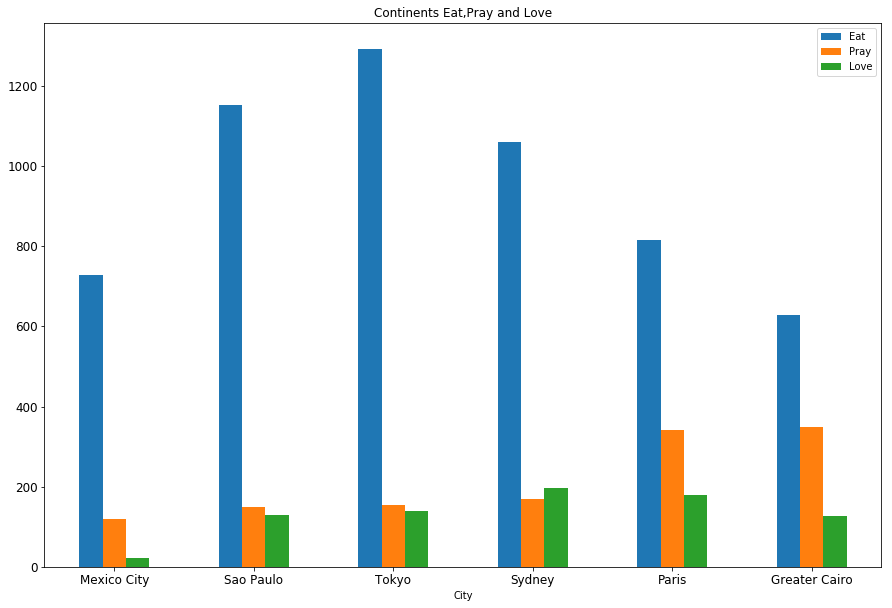

In [182]:
ay = Continent_Scores.plot.bar(x='City',rot=0,figsize=(15,10),title ="Continents Eat,Pray and Love",fontsize=12)

#### *Towards Recommendation System (Content based Recommendation System)*

##### *Creating user profile for each criteria*

In [183]:
#initializing the user profile with score for each of Eat, Pray and Love PREFERENCES
Columns=['Eat','Pray','Love']
#Now assigning a score on a scale from 1 to 5 for each preference
My_EPL_Eat_Preference=3
My_EPL_Pray_Preference=5
My_EPL_Love_Preference=4

My_EPL_Preferences = {'Eat': [My_EPL_Eat_Preference],
                      'Pray':[My_EPL_Pray_Preference],
                      'Love':[My_EPL_Love_Preference]
        }

My_EPL_Profile = pd.DataFrame(My_EPL_Preferences,columns= Columns)

print (My_EPL_Profile)

   Eat  Pray  Love
0    3     5     4


In [184]:
Continent_Scores_OneUser=Continent_Scores.copy()

##### *(One User) Trips route recommendations to largest city in each continent based on Eat,Pray,Love criteria + User preferences*

In [185]:
#Trips route recommendations to largest city in each continent based on Eat,Pray,Love criteria + User preferences
#This is an illustration for one user 
EPL_EAT=My_EPL_Profile.loc[0].Eat
EPL_PRAY=My_EPL_Profile.loc[0].Pray
EPL_LOVE=My_EPL_Profile.loc[0].Love

Total_Rating=EPL_EAT+EPL_PRAY+EPL_LOVE

Continent_Scores_OneUser['MyScore']= ((Continent_Scores_OneUser['Eat']* EPL_EAT + 
                                       Continent_Scores_OneUser['Pray']* EPL_PRAY + 
                                       Continent_Scores_OneUser['Love']* EPL_LOVE)/(Total_Rating))

In [186]:
#Recommendations arranged in descending order according to user profile, weighted average.
Sorted_OneUser=Continent_Scores_OneUser.sort_values(by=['MyScore', 'Continent Name'], ascending=False)
print(Sorted_OneUser)

  Continent Name    Country           City   Eat  Pray  Love     MyScore
2           Asia      Japan          Tokyo  1292   153   140  433.416667
4         Europe     France          Paris   816   341   178  405.416667
3      Australia  Australia         Sydney  1061   169   197  401.333333
1  South America     Brazil      Sao Paulo  1153   148   130  393.250000
5         Africa      Egypt  Greater Cairo   629   348   126  344.250000
0  North America     Mexico    Mexico City   728   120    23  239.666667


In [198]:
#print the results\
print('According to your user profile and your rating for Eat, Pray and Love, You can visit the following cities by the following order: ')
print('------------------------------------------------------------------------------------------------------------------------------------')
print((Sorted_OneUser["City"] + ' in '+Sorted_OneUser["Country"] + ' at ' + Sorted_OneUser["Continent Name"]))

According to your user profile and your rating for Eat, Pray and Love, You can visit the following cities by the following order: 
------------------------------------------------------------------------------------------------------------------------------------
2                    Tokyo in Japan at Asia
4                 Paris in France at Europe
3          Sydney in Australia at Australia
1      Sao Paulo in Brazil at South America
5          Greater Cairo in Egypt at Africa
0    Mexico City in Mexico at North America
dtype: object


##### *(Multi Users) Trips route recommendations to largest city in each continent based on Eat,Pray,Love criteria + User preferences*

In [105]:
#initializing the user profile with score for each of Eat, Pray and Love PREFERENCES
Columns=['User','Eat','Pray','Love']
#Now assigning a score on a scale from 1 to 5 for each preference
Users=['Heba','Reda','Omar','Hassan','Layla']
My_EPL_Eat_Preference1=[3,1,4,4,5]
My_EPL_Pray_Preference1=[5,5,4,3,3]
My_EPL_Love_Preference1=[4,4,3,5,4]

res_list = [] 
for i in range(0, len(My_EPL_Eat_Preference1)): 
    res_list.append(My_EPL_Eat_Preference1[i] + My_EPL_Pray_Preference1[i]+My_EPL_Love_Preference1[i]) 
    #print(res_list)

EPL_Profile = pd.DataFrame({'User':Users, 'Eat':My_EPL_Eat_Preference1,'Pray':My_EPL_Pray_Preference1,'Love':My_EPL_Love_Preference1, 'Total':  res_list})

print (EPL_Profile)

     User  Eat  Pray  Love  Total
0    Heba    3     5     4     12
1    Reda    1     5     4     10
2    Omar    4     4     3     11
3  Hassan    4     3     5     12
4   Layla    5     3     4     12


In [106]:
Continent_Scores_Multi=pd.DataFrame()
Continent_Scores_Multi=Continent_Scores.copy()
Continent_Scores_Multi

,Continent Name,Country,City,Eat,Pray,Love
0,North America,Mexico,Mexico City,728,120,23
1,South America,Brazil,Sao Paulo,1153,148,130
2,Asia,Japan,Tokyo,1292,153,140
3,Australia,Australia,Sydney,1061,169,197
4,Europe,France,Paris,816,341,178
5,Africa,Egypt,Greater Cairo,629,348,126


In [107]:
for i in range(0,len(Continent_Scores_Multi)):
    #print(Continent_Scores_Multi.loc[i, "Eat"], Continent_Scores_Multi.loc[i, "Pray"],Continent_Scores_Multi.loc[i, "Love"]) 
    for j in range(0,len(EPL_Profile)): 
        #print(Continent_Scores_Multi.loc[i, "Eat"], Continent_Scores_Multi.loc[i, "Pray"],Continent_Scores_Multi.loc[i, "Love"]) 
        #print(EPL_Profile.loc[j, "Eat"], EPL_Profile.loc[j, "Pray"],EPL_Profile.loc[j, "Love"]) 
        
        temp=EPL_Profile.loc[j, "User"]
        #print(temp)
       
        #Total_Rating=(EPL_Profile.loc[j,"Eat"]+EPL_Profile.loc[j,"Pray"]+EPL_Profile.loc[j,"Love"])
        #print(EPL_Profile.loc[j, "Total"])
        Continent_Scores_Multi.loc[i, temp]=((Continent_Scores_Multi.loc[i, "Eat"]* EPL_Profile.loc[j, "Eat"])+
                                             (Continent_Scores_Multi.loc[i, "Pray"]* EPL_Profile.loc[j, "Pray"])+
                                             (Continent_Scores_Multi.loc[i, "Love"]* EPL_Profile.loc[j, "Love"])/
                                             (EPL_Profile.loc[j, "Total"])
                                            )
        
        Continent_Scores_Multi.loc[i, temp]=Continent_Scores_Multi.loc[i, temp]/(EPL_Profile.loc[j, "Total"])
        #print(Continent_Scores_Multi.loc[i, temp])
        #print((EPL_Profile.loc[j,"Eat"]+EPL_Profile.loc[j,"Pray"]+EPL_Profile.loc[j,"Love"]))
        #print(Continent_Scores_Multi.loc[i, "Score"])
        #store the score and round to 2 decimal places
        Score_Per_User_Rounded=Continent_Scores_Multi.loc[i, temp]
        Continent_Scores_Multi.loc[i, temp]=round(Score_Per_User_Rounded,2)

Continent_Scores_Multi
#This is a dataset contains preferences scores for many users. It can be used as a start to build knowledge about cities with higher preferences
#Also, it can be used for offerings - categorize users by groups according to the similar preferences

,Continent Name,Country,City,Eat,Pray,Love,Heba,Reda,Omar,Hassan,Layla
0,North America,Mexico,Mexico City,728,120,23,232.64,133.72,308.93,273.47,333.97
1,South America,Brazil,Sao Paulo,1153,148,130,353.53,194.50,476.31,425.85,521.03
2,Asia,Japan,Tokyo,1292,153,140,390.64,211.30,528.93,473.78,580.47
3,Australia,Australia,Sydney,1061,169,197,341.14,198.48,452.16,402.76,489.81
4,Europe,France,Paris,816,341,178,351.03,259.22,425.14,363.43,430.19
5,Africa,Egypt,Greater Cairo,629,348,126,305.75,241.94,358.40,301.04,352.58


In [108]:
Continent_Scores_Multi_results=Continent_Scores_Multi.copy()

In [109]:
Continent_Scores_Multi_results.drop('Eat',axis=1, inplace=True)
Continent_Scores_Multi_results.drop('Pray',axis=1, inplace=True)
Continent_Scores_Multi_results.drop('Love',axis=1, inplace=True)

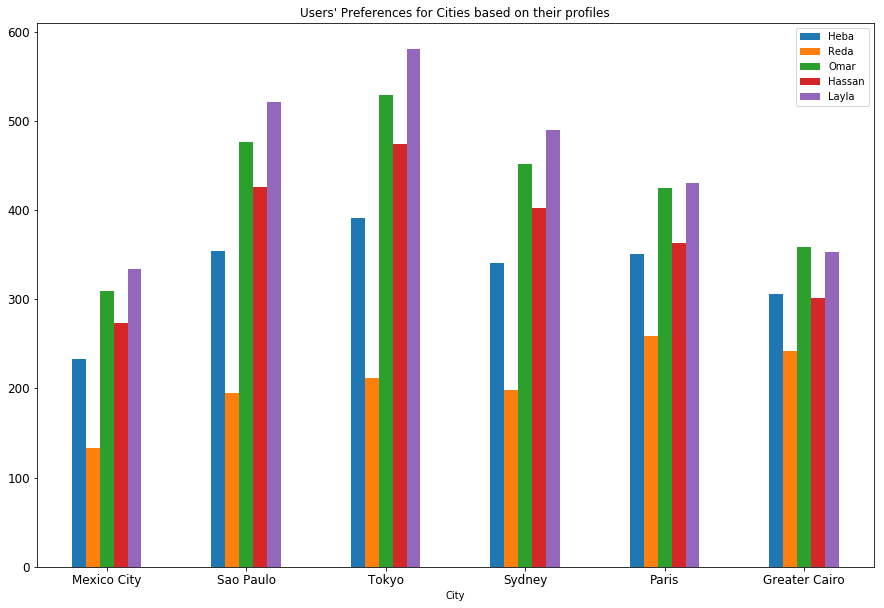

In [110]:
az2 = Continent_Scores_Multi_results.plot.bar(x='City',rot=0,figsize=(15,10),title ="Users' Preferences for Cities based on their profiles",fontsize=12)